In [132]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import torchgan as tg
import os
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
import torchvision.utils as vutils
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [133]:
X_train = np.load('specs_1channel_train.npy')
X_train[0]

array([[ 87.74,  83.54,  73.91, ...,  79.33,  80.94,  80.03],
       [ 90.84,  87.04,  78.53, ...,  79.33,  80.03,  87.04],
       [ 61.54,  68.67,  92.84, ...,  83.94,  83.54,  87.04],
       ...,
       [167.4 , 155.17, 134.68, ..., 141.56, 154.88, 155.17],
       [165.74, 161.72, 156.05, ..., 137.24, 144.49, 151.35],
       [162.9 , 162.9 , 163.97, ..., 153.41, 168.47, 169.65]])

In [134]:
X_train[0]

array([[ 87.74,  83.54,  73.91, ...,  79.33,  80.94,  80.03],
       [ 90.84,  87.04,  78.53, ...,  79.33,  80.03,  87.04],
       [ 61.54,  68.67,  92.84, ...,  83.94,  83.54,  87.04],
       ...,
       [167.4 , 155.17, 134.68, ..., 141.56, 154.88, 155.17],
       [165.74, 161.72, 156.05, ..., 137.24, 144.49, 151.35],
       [162.9 , 162.9 , 163.97, ..., 153.41, 168.47, 169.65]])

In [135]:
y_train=np.load('train_superclasses.npy', allow_pickle=True)

In [136]:
y_train = list(y_train)
y_train

[['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['MI'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 [],
 [],
 ['NORM'],
 [],
 ['NORM'],
 ['STTC'],
 [],
 ['NORM'],
 ['NORM'],
 ['STTC'],
 ['NORM'],
 ['STTC'],
 ['NORM'],
 ['HYP'],
 ['NORM'],
 ['CD'],
 ['NORM'],
 [],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['STTC', 'MI'],
 ['CD'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['HYP', 'CD'],
 ['NORM'],
 ['NORM'],
 ['STTC'],
 ['CD'],
 ['MI', 'CD'],
 ['NORM'],
 ['CD'],
 ['NORM'],
 ['STTC'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['MI', 'CD'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['STTC', 'CD'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['HYP'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['NORM'],
 ['STTC', 'CD'],
 ['MI', 'CD'],
 ['NOR

In [137]:
diags = []
indeces = []
for i in range(len(y_train)):
    if y_train[i]:
        diags.append(y_train[i][0])
    else:
        indeces.append(i)

In [138]:
len(diags)

19230

In [139]:
len(indeces)

371

In [140]:
X_train = np.delete(X_train, indeces, axis=0)

In [141]:
dict_diags = dict(Counter(diags))

In [142]:
num_diags={}
k=0
for key, value in dict_diags.items():
    num_diags[key] = k
    k+=1

In [143]:
num_diags

{'NORM': 0, 'MI': 1, 'STTC': 2, 'HYP': 3, 'CD': 4}

In [144]:
num_diags_train=[]
for diag in diags:
    num_diags_train.append(num_diags[diag])

In [145]:
y_train = num_diags_train

In [146]:
y_train = torch.LongTensor(y_train)
y_train = torch.reshape(y_train, (1, y_train.shape[0]))

In [151]:
len(X_train)

19230

In [152]:
y_train
np.save('train_diags.npy', y_train)
np.save('train_without_missing_values.npy', X_train)

In [130]:
u = np.load('train_diags.npy')

In [131]:
u

array([[0, 0, 0, ..., 2, 0, 0]], dtype=int64)

In [17]:
class SpecDataset(TensorDataset):
    def __init__(self, x, y):
        self.x=x
        self.y=y
    def __len__(self):
        return len(self.x)
    def __getitem__(self, i):
        x=self.x[i].reshape(1, 64, 64)/255
        y=self.y[0][i]
        return (x, y)

In [18]:
def get_loader(x, y, batch_size=128, shuffle=False):
    dataset=SpecDataset(x, y)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)

In [19]:
train_loader = get_loader(X_train, y_train, shuffle=True)

In [20]:
dataset = SpecDataset(X_train, y_train)
len(dataset.y[0])

19230

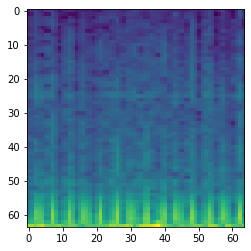

In [21]:
X_train[19]
dataset.y[0][20]
plt.imshow(X_train[20])

Text(0.5, 0.98, 'class 0: NORM: Normal ECG')

<Figure size 432x288 with 0 Axes>

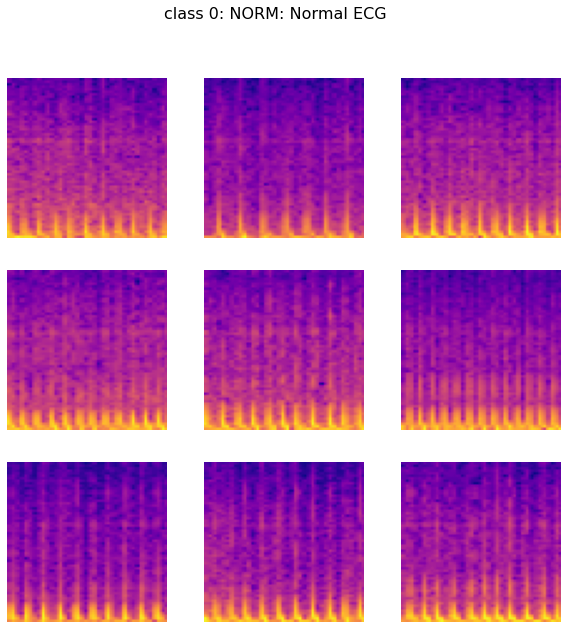

In [22]:
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(10):
    if dataset.y[0][i] == 0:
        ax = plt.subplot(nrows, ncols, n + 1)
        ax.axis('off')
        ax.imshow(X_train[i], cmap='plasma')
        n+=1
fig.suptitle('class 0: NORM: Normal ECG', fontsize=16)

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/4037432927.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

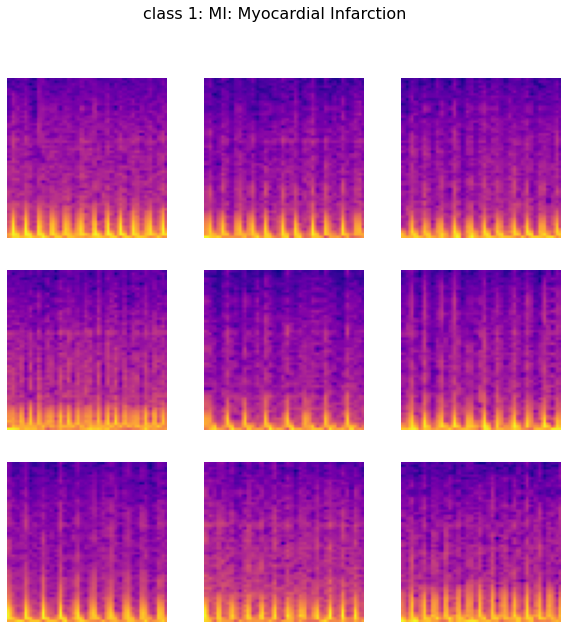

In [23]:
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(1000):
    if dataset.y[0][i] == 1:
        ax = plt.subplot(nrows, ncols, n + 1)
        ax.axis('off')
        ax.imshow(X_train[i], cmap='plasma')
        n+=1
    if n==9:
        break
fig.suptitle('class 1: MI: Myocardial Infarction', fontsize=16)    
fig.show()

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/2692231896.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

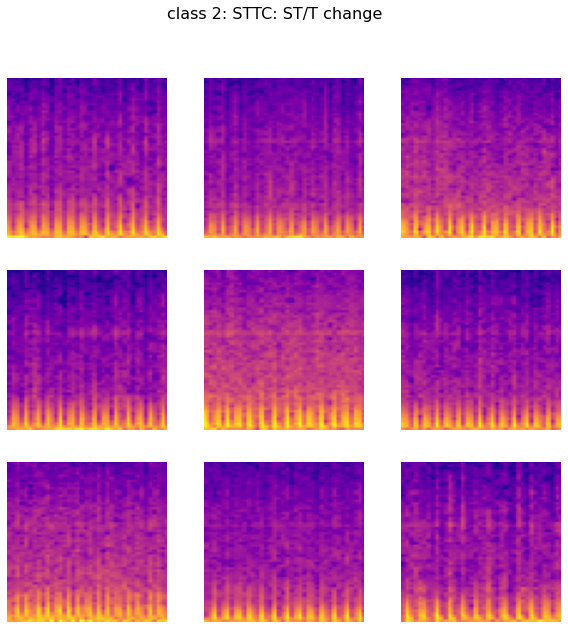

In [24]:
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(1000):
    if dataset.y[0][i] == 2:
        ax = plt.subplot(nrows, ncols, n + 1)
        ax.axis('off')
        ax.imshow(X_train[i], cmap='plasma')
        n+=1
    if n==9:
        break
fig.suptitle('class 2: STTC: ST/T change', fontsize=16)
fig.show()

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/1679602229.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

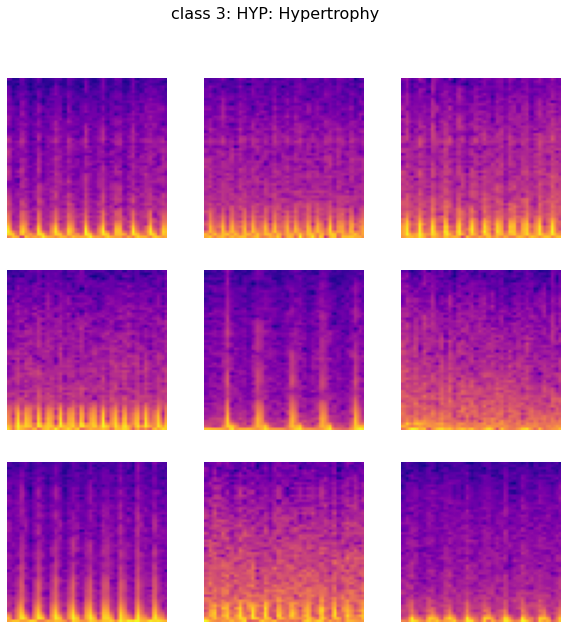

In [25]:
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(1000):
    if dataset.y[0][i] == 3:
        ax = plt.subplot(nrows, ncols, n + 1)
        ax.axis('off')
        ax.imshow(X_train[i], cmap='plasma')
        n+=1
    if n==9:
        break
fig.suptitle('class 3: HYP: Hypertrophy', fontsize=16)
fig.show()

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/2117830719.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

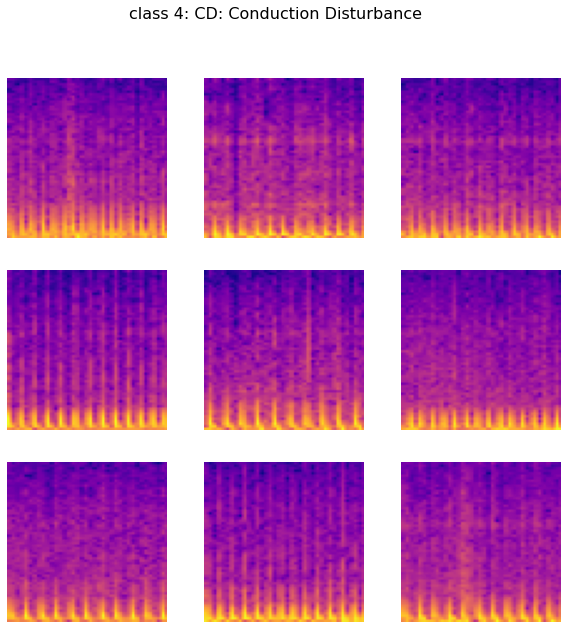

In [26]:
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(1000):
    if dataset.y[0][i] == 4:
        ax = plt.subplot(nrows, ncols, n + 1)
        ax.axis('off')
        ax.imshow(X_train[i], cmap='plasma')
        n+=1
    if n==9:
        break
fig.suptitle('class 4: CD: Conduction Disturbance', fontsize=16)
fig.show()

In [27]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.get_device_name(device=device)

'NVIDIA GeForce GTX 1060 6GB'

In [28]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

G.apply(weights_init)
D.apply(weights_init)

NameError: name 'G' is not defined

In [159]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.label_emb = nn.Embedding(5, 10)
        self.feature = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Sigmoid()

        )
    def forward(self, z, labels):
        z=z.view(z.size(0), 90)
        c = self.label_emb(labels)
        x = torch.cat([z,c], 1)
        out = self.feature(x.view(x.shape[0], x.shape[1], 1, 1))
        return out

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #self.label_emb = nn.Embedding(5, 260)
        self.feature = nn.Sequential(
            nn.Conv2d(nc, ndf, kernel_size = 4, stride = 2, padding =1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf, ndf * 2, kernel_size = 4, stride = 2, padding =1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size = 4, stride = 2, padding =1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size = 4, stride = 2, padding =1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(ndf * 8, 1, kernel_size = 4, stride = 1, bias=False),
            nn.Sigmoid()

        )
    def forward(self, z):#, labels):
        #c = self.label_emb(labels)
        #z = z.view(z.shape[0], 4096)
        #x=torch.cat([z, c], 1)
        return self.feature(z.view(z.shape[0], 1, 64, 64))
    

In [160]:
ngf = 32 #size of feature maps for gen
ndf = 16#size of feature maps for dis
nc = 1 #num of channels
nz=100

In [161]:
G = Generator().to(device)
D = Discriminator().to(device)

In [162]:
loss = nn.BCELoss()
batch_size=128
epochs = 4
lr=2e-4
real_label = 1
fake_label = 0

G_optimizer = optim.Adam(G.parameters(), betas=(0.5, 0.999), lr=lr)
D_optimizer = optim.Adam(D.parameters(), betas=(0.5, 0.999), lr=lr)

Epoch 0 Iteration 0: discriminator_loss 0.01201 generator_loss 0.00385
Epoch 0 Iteration 10: discriminator_loss 0.01218 generator_loss 0.02629
Epoch 0 Iteration 20: discriminator_loss 0.03627 generator_loss 0.03575
Epoch 0 Iteration 30: discriminator_loss 0.04292 generator_loss 0.03662
Epoch 0 Iteration 40: discriminator_loss 0.03199 generator_loss 0.04605
Epoch 0 Iteration 50: discriminator_loss 0.04669 generator_loss 0.03355
Epoch 0 Iteration 60: discriminator_loss 0.03777 generator_loss 0.04136
Epoch 0 Iteration 70: discriminator_loss 0.04038 generator_loss 0.05391
Epoch 0 Iteration 80: discriminator_loss 0.03748 generator_loss 0.05900
Epoch 0 Iteration 90: discriminator_loss 0.03427 generator_loss 0.03637
Epoch 0 Iteration 100: discriminator_loss 0.03125 generator_loss 0.08063
Epoch 0 Iteration 110: discriminator_loss 0.05376 generator_loss 0.10266
Epoch 0 Iteration 120: discriminator_loss 0.04821 generator_loss 0.04780
Epoch 0 Iteration 130: discriminator_loss 0.04109 generator_lo

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/2761231416.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 4, figsize=(10,10))


Epoch 1 Iteration 50: discriminator_loss 0.03845 generator_loss 0.05674
Epoch 1 Iteration 60: discriminator_loss 0.03331 generator_loss 0.04972
Epoch 1 Iteration 70: discriminator_loss 0.03286 generator_loss 0.10409
Epoch 1 Iteration 80: discriminator_loss 0.03423 generator_loss 0.06113
Epoch 1 Iteration 90: discriminator_loss 0.03989 generator_loss 0.05552
Epoch 1 Iteration 100: discriminator_loss 0.02581 generator_loss 0.04984
Epoch 1 Iteration 110: discriminator_loss 0.04209 generator_loss 0.09466
Epoch 1 Iteration 120: discriminator_loss 0.02819 generator_loss 0.04671
Epoch 1 Iteration 130: discriminator_loss 0.03360 generator_loss 0.05548
Epoch 1 Iteration 140: discriminator_loss 0.02903 generator_loss 0.05380
Epoch 1 Iteration 150: discriminator_loss 0.02347 generator_loss 0.06576
Epoch 2 Iteration 0: discriminator_loss 0.04655 generator_loss 0.08222
Epoch 2 Iteration 10: discriminator_loss 0.03529 generator_loss 0.10230
Epoch 2 Iteration 20: discriminator_loss 0.03054 generator_

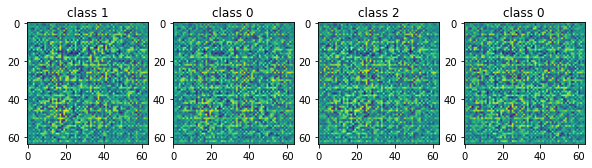

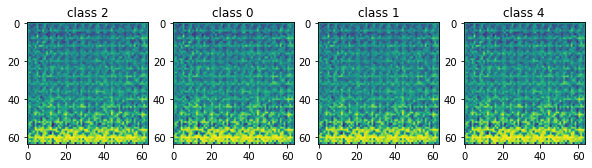

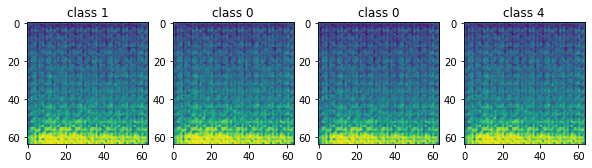

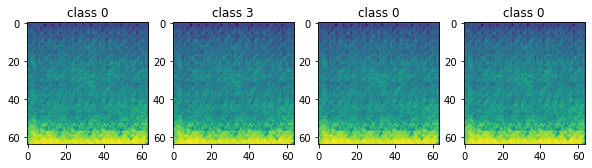

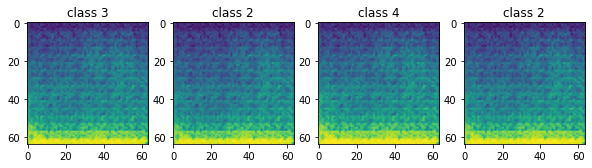

...

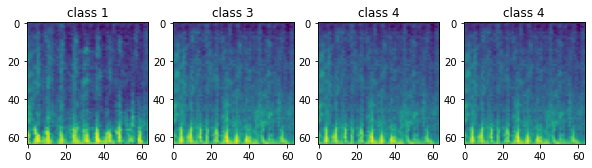

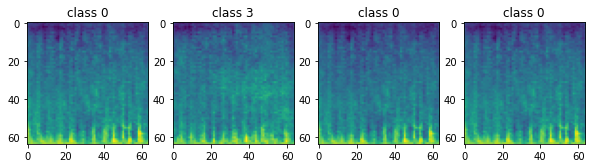

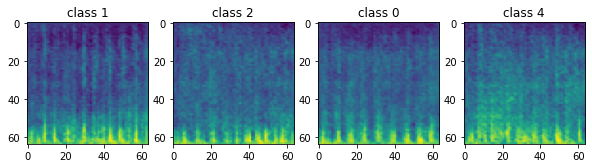

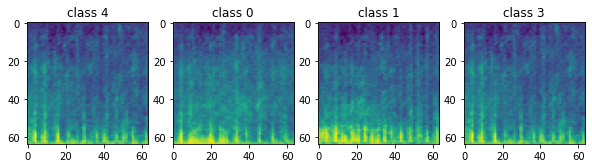

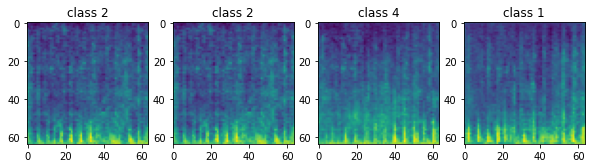

In [163]:
Gen_loss=[]
Dis_loss=[]
idxs=[]
i=0
for epoch in range(epochs):
    for idx, (imgs, labs) in enumerate(train_loader):
        for k in range(15):
            real_inputs = imgs.to(device)
            real_class_label = labs.cuda()
            real_outputs = D(real_inputs.float())#, real_class_label)
            real_label = torch.ones(real_inputs.shape[0], 1, 1, 1).to(device)

            fake_class_labels = torch.LongTensor(np.random.randint(0, 5, batch_size)).cuda()

            noise = torch.rand(batch_size, 90, 1, 1, device=device)
            fake_inputs = G(noise, fake_class_labels)
            fake_outputs = D(fake_inputs)#, fake_class_labels)
            fake_label = torch.zeros(fake_inputs.shape[0], 1, 1, 1).to(device)

            outputs = torch.cat((real_outputs, fake_outputs), 0)
            targets = torch.cat((real_label, fake_label), 0)

            #D_loss = tg.losses.wasserstein_discriminator_loss(real_outputs, fake_outputs)
            D_loss = loss(outputs, targets)

            D_optimizer.zero_grad()
            D_loss.backward()
            D_optimizer.step()
        for k in range(9):
            noise = torch.rand(batch_size, 90, 1, 1, device=device)
            fake_class_labels = torch.LongTensor(np.random.randint(0, 5, batch_size)).cuda()
            fake_inputs = G(noise, fake_class_labels)
            fake_outputs = D(fake_inputs)#, fake_class_labels)
            fake_targets = torch.ones([fake_inputs.shape[0], 1, 1, 1]).to(device)

            #G_loss = tg.losses.wasserstein_generator_loss(fake_outputs)
            G_loss = loss(fake_outputs, fake_targets)
            G_optimizer.zero_grad()
            G_loss.backward()
            G_optimizer.step()
        Gen_loss.append(G_loss.item())
        Dis_loss.append(D_loss.item())
        i+=1
        idxs.append(i)
        if (idx >= (len(train_loader)+batch_size)):
            idx = len(train_loader)

        if idx % 10 == 0 or idx == len(train_loader):
            print('Epoch {} Iteration {}: discriminator_loss {:.5f} generator_loss {:.5f}'.format(epoch, idx, D_loss.item(), G_loss.item()))
            fig, axs = plt.subplots(1, 4, figsize=(10,10))
            noise = torch.rand(4, 90, 1, 1).cuda()
            labels = torch.LongTensor(np.random.randint(0, 5, 4)).cuda()
            noise = noise.to(device) 
            output = G(noise, labels)
            for i in range(4):
                axs[i].imshow(output[i].permute(1, 2, 0).detach().cpu())
                axs[i].title.set_text(f'class {labels[i]}')

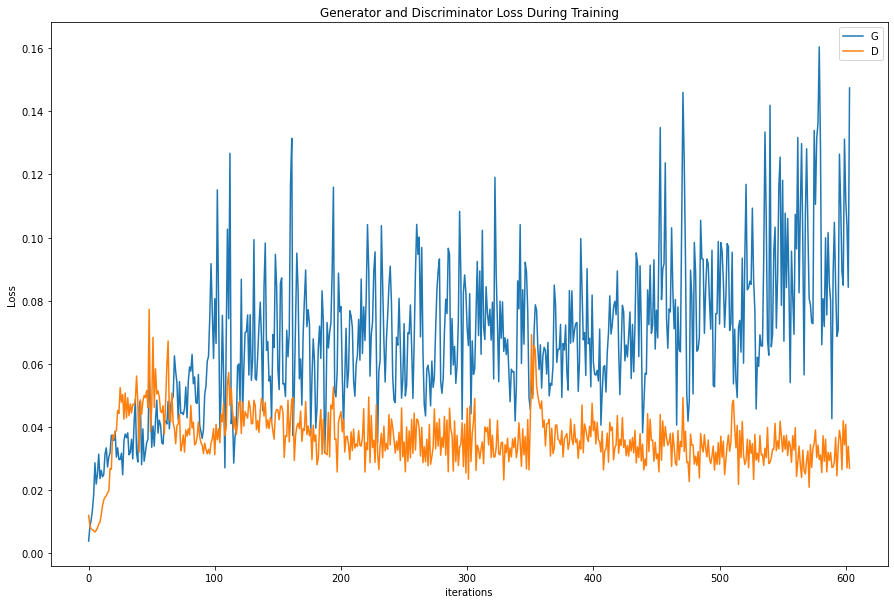

In [164]:
plt.figure(figsize=(15,10))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(Gen_loss,label="G")
plt.plot(Dis_loss,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

tensor([2, 4, 2, 1, 3, 4, 1, 4, 0, 4, 2, 4, 0, 4, 1, 1, 1, 2, 0, 3, 4, 1, 3, 0,
        1, 0, 1, 2, 2, 2, 4, 2, 1, 3, 1, 1, 0, 1, 2, 3, 1, 4, 3, 3, 4, 0, 4, 4,
        2, 0, 0, 3, 0, 2, 0, 1, 1, 0, 4, 3, 2, 3, 3, 4, 1, 4, 0, 4, 3, 2, 4, 2,
        3, 2, 4, 3, 2, 2, 3, 0, 4, 1, 0, 4, 3, 0, 3, 2, 2, 1, 1, 0, 0, 3, 4, 3,
        1, 4, 4, 2, 2, 0, 1, 4, 1, 4, 3, 0, 2, 4, 2, 1, 4, 0, 1, 2, 4, 4, 0, 1,
        3, 3, 0, 2, 2, 0, 2, 3], device='cuda:0')


<Figure size 432x288 with 0 Axes>

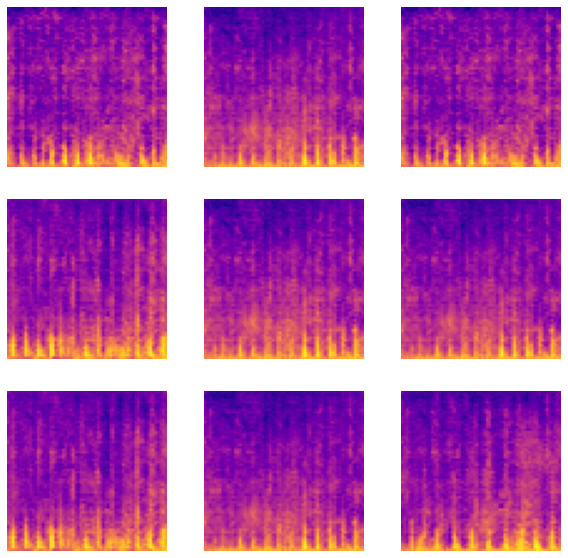

In [166]:
noise = torch.rand(128, 90, 1, 1, device=device)
labels = torch.LongTensor(np.random.randint(0, 5, 128)).cuda()
print(labels)
noise = noise.to(device) 
output = G(noise, labels)
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[i].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1

In [167]:
label = torch.LongTensor(np.random.randint(0, 4, 100)).cuda()
print(label)

tensor([3, 2, 3, 3, 1, 3, 0, 1, 1, 3, 2, 3, 1, 2, 2, 3, 1, 2, 2, 0, 1, 0, 0, 0,
        2, 1, 3, 0, 3, 0, 2, 0, 0, 2, 3, 2, 0, 3, 3, 2, 3, 1, 0, 3, 2, 0, 0, 3,
        0, 1, 2, 1, 3, 3, 2, 1, 0, 2, 3, 0, 1, 2, 0, 3, 0, 2, 2, 1, 1, 3, 0, 0,
        0, 0, 3, 0, 2, 1, 0, 0, 2, 3, 2, 0, 1, 3, 1, 2, 1, 3, 3, 0, 1, 0, 3, 1,
        2, 1, 0, 1], device='cuda:0')


C:\Users\matve\AppData\Local\Temp/ipykernel_14924/632558928.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

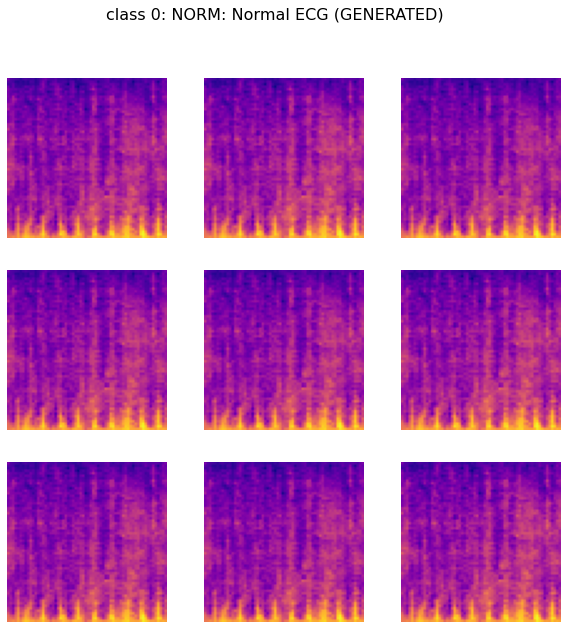

In [168]:
noise = torch.rand(9, 90, 1, 1, device=device)
labels = torch.zeros(9).cuda().int()
output = G(noise, labels)
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[i].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1
fig.suptitle('class 0: NORM: Normal ECG (GENERATED)', fontsize=16)    
fig.show()

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/568478070.py:15: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

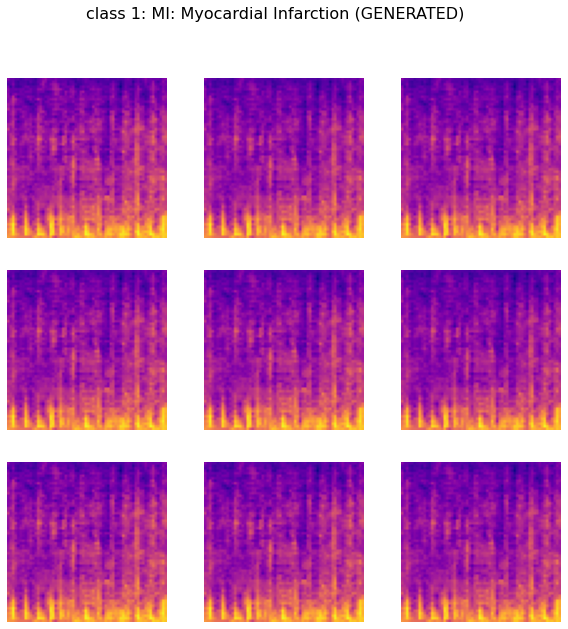

In [169]:
noise = torch.rand(9, 90, 1, 1, device=device)
labels = torch.ones(9).cuda().int()
output = G(noise, labels)
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[i].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1
fig.suptitle('class 1: MI: Myocardial Infarction (GENERATED)', fontsize=16)    
fig.show()

tensor([[[0.5026, 0.4516, 0.4407,  ..., 0.4444, 0.4815, 0.5003],
         [0.4538, 0.4447, 0.4439,  ..., 0.4494, 0.5094, 0.4732],
         [0.4310, 0.4427, 0.4891,  ..., 0.4919, 0.4930, 0.4968],
         ...,
         [0.7576, 0.7131, 0.6719,  ..., 0.7505, 0.7538, 0.7578],
         [0.7662, 0.7444, 0.7116,  ..., 0.8139, 0.7599, 0.7823],
         [0.7424, 0.7418, 0.7493,  ..., 0.8035, 0.8297, 0.8130]]],
       device='cuda:0', grad_fn=<SelectBackward0>)
tensor([[[0.5055, 0.4549, 0.4494,  ..., 0.4577, 0.4952, 0.5005],
         [0.4502, 0.4461, 0.4574,  ..., 0.4622, 0.5314, 0.4676],
         [0.4207, 0.4370, 0.4964,  ..., 0.4965, 0.5004, 0.5050],
         ...,
         [0.7765, 0.7394, 0.7139,  ..., 0.7912, 0.7932, 0.7940],
         [0.7849, 0.7719, 0.7446,  ..., 0.8425, 0.7936, 0.8180],
         [0.7629, 0.7601, 0.7601,  ..., 0.8182, 0.8537, 0.8407]]],
       device='cuda:0', grad_fn=<SelectBackward0>)


C:\Users\matve\AppData\Local\Temp/ipykernel_14924/3047010164.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

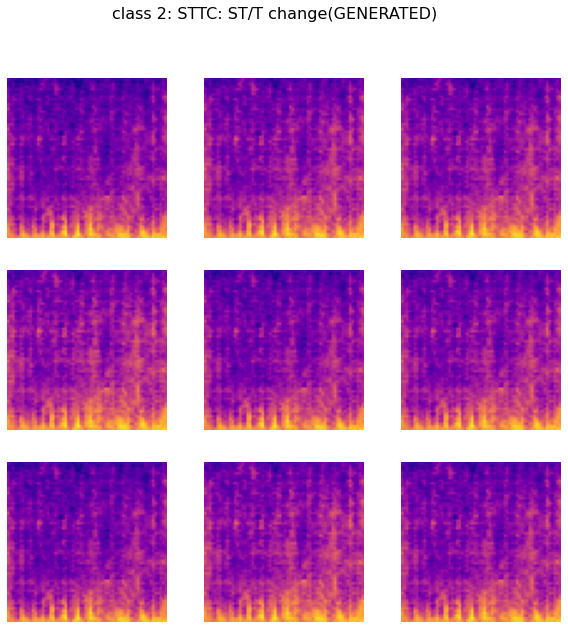

In [170]:
noise = torch.rand(9, 90, 1, 1, device=device)
labels = torch.ones(9).cuda().int()*2
output = G(noise, labels)
print(output[0])
print(output[1])
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[i].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1

fig.suptitle('class 2: STTC: ST/T change(GENERATED)', fontsize=16)    
fig.show()

tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)
tensor([3], device='cuda:0', dtype=torch.int32)


C:\Users\matve\AppData\Local\Temp/ipykernel_14924/2265200607.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

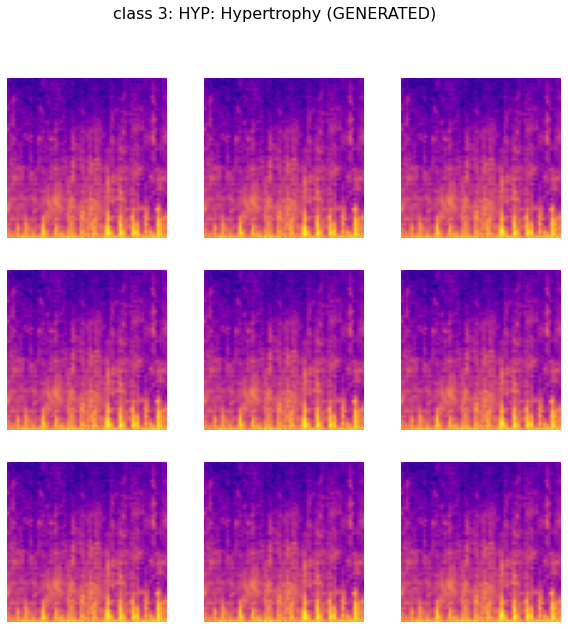

In [171]:
# noise = torch.rand(9, 90, 1, 1, device=device)
# labels = torch.ones(9).cuda().int()*2
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    noise = torch.rand(1, 90, 1, 1, device=device)
    labels = torch.ones(1).cuda().int()*3
    print(labels)
    output = G(noise, labels)
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[0].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1
fig.suptitle('class 3: HYP: Hypertrophy (GENERATED)', fontsize=16)    
fig.show()

C:\Users\matve\AppData\Local\Temp/ipykernel_14924/1401690558.py:17: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 432x288 with 0 Axes>

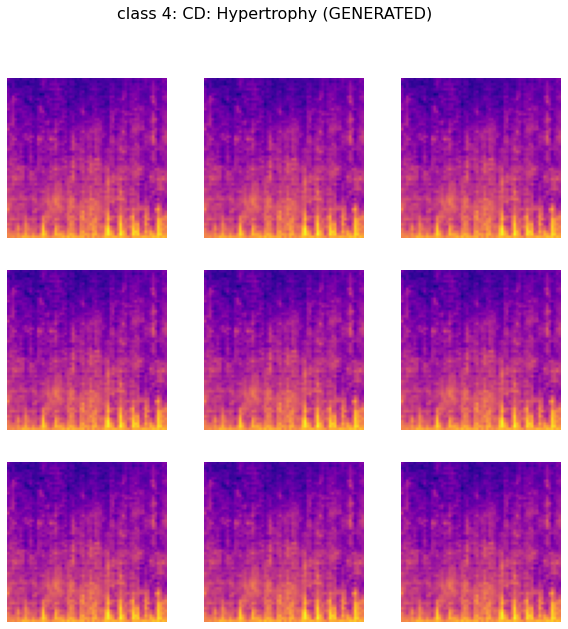

In [172]:
# noise = torch.rand(9, 90, 1, 1, device=device)
# labels = torch.ones(9).cuda().int()*2
plt.subplots_adjust(hspace=0.1)
ncols = 3
nrows = 3
n=0
fig, axs = plt.subplots(3, 3, figsize=(10, 10))
for i in range(9):
    noise = torch.rand(1, 90, 1, 1, device=device)
    labels = torch.ones(1).cuda().int()*4
    output = G(noise, labels)
    ax = plt.subplot(nrows, ncols, n + 1)
    ax.axis('off')
    ax.imshow(output[0].cpu().detach().permute(1,2,0), cmap='plasma')
    n+=1
fig.suptitle('class 4: СD: Hypertrophy (GENERATED)', fontsize=16)    
fig.show()